# Лабораторная работа №4 Создание эффектов и сжатие изображений

#Часть 1 Спецэффекты

##Задание 1

Используйте фильтр J, чтобы создать эффект тиснения для произвольного изображения:

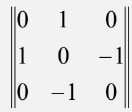

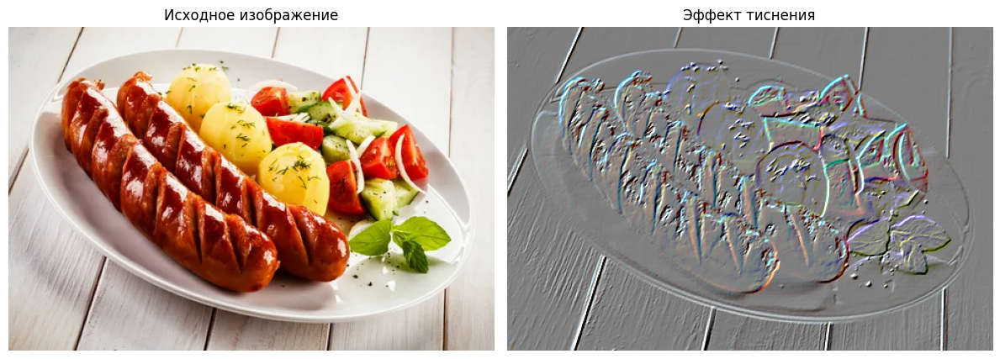

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

img = cv2.imread('food_1.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

J = np.array([
    [0, 1, 0],
    [1, 0, -1],
    [0, -1, 0]
], dtype=np.float32)

embossed = np.zeros_like(img_rgb, dtype=np.float32)
for i in range(3):
    embossed[:,:,i] = cv2.filter2D(img_rgb[:,:,i].astype(np.float32), -1, J)

embossed = embossed + 128
embossed = np.clip(embossed, 0, 255).astype(np.uint8)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Исходное изображение')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(embossed)
plt.title('Эффект тиснения')
plt.axis('off')

plt.tight_layout()
plt.show()

##Задание 2

Сделайте цифровой негатив для произвольного цветного изображения.

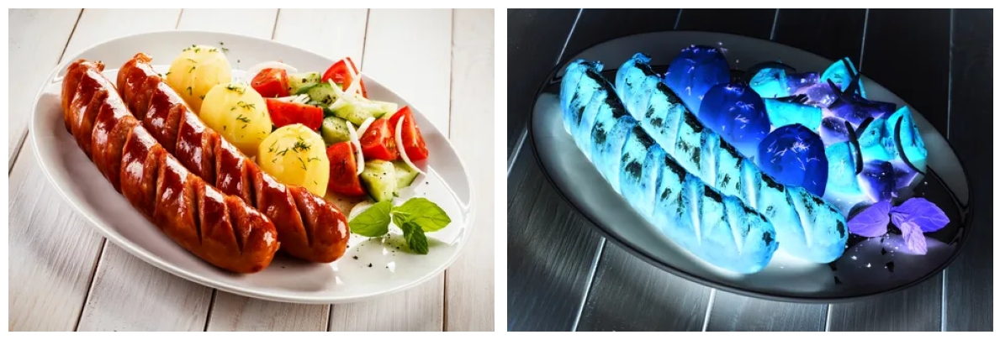

In [ ]:
negative = 255 - img_rgb

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(negative)
plt.axis('off')

plt.tight_layout()
plt.show()

##Задание 3

Реализуйте подсветку краев через пайплайн обработки: Медианный фильтр + выделение краев + фильтр «максимума»

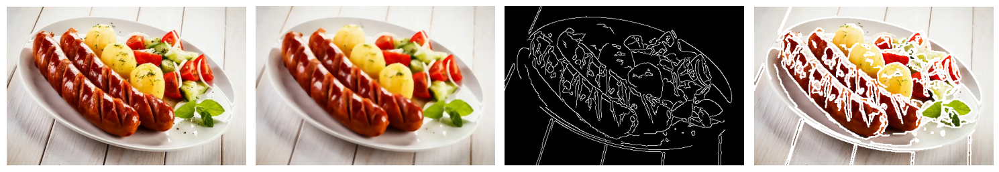

In [ ]:
median = cv2.medianBlur(img_rgb, 5)
gray = cv2.cvtColor(median, cv2.COLOR_RGB2GRAY)
edges = cv2.Canny(gray, 50, 150)
kernel = np.ones((3,3), np.uint8)
dilated_edges = cv2.dilate(edges, kernel)
result = cv2.bitwise_or(img_rgb, cv2.cvtColor(dilated_edges, cv2.COLOR_GRAY2RGB))

plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(img_rgb)
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(median)
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(edges, cmap='gray')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(result)
plt.axis('off')

plt.tight_layout()
plt.show()


##Задание 4*

Создайте эффект стекла для произвольного изображения

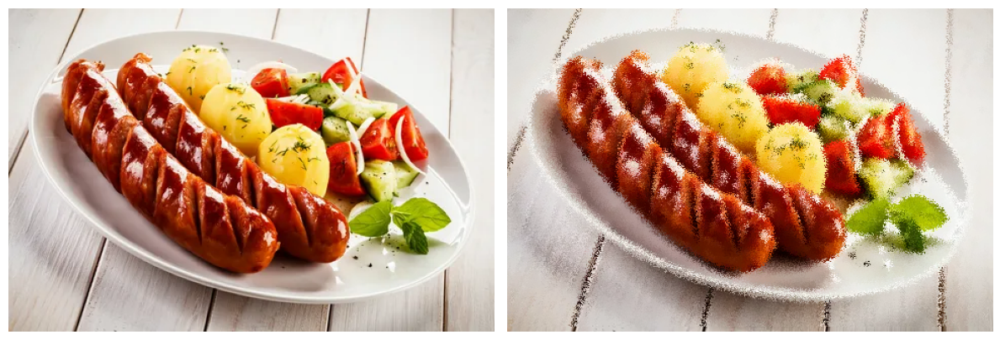

In [ ]:
h, w = img_rgb.shape[:2]
glass_effect = img_rgb.copy()

for i in range(h-5):
    for j in range(w-5):
        dx = np.random.randint(0, 5)
        dy = np.random.randint(0, 5)
        glass_effect[i, j] = img_rgb[i+dy, j+dx]

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(glass_effect)
plt.axis('off')

plt.tight_layout()
plt.show()


##Часть 2 Алгоритмы сжатия

##Задание 1

Используйте алгоритм LZW (https://github.com/adityagupta3006/LZW-Compressor-in-Python), чтобы сжать следующее изображение I:

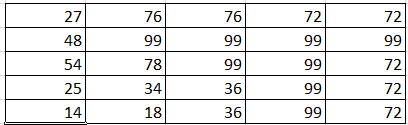

Определите коэффициент сжатия

In [ ]:
import numpy as np

def lzw_compress(data):
    dictionary = {bytes([i]): i for i in range(256)}
    dict_size = 256
    w = bytes()
    result = []

    for pixel in data:
        byte_val = bytes([pixel])
        wc = w + byte_val
        if wc in dictionary:
            w = wc
        else:
            result.append(dictionary[w])
            dictionary[wc] = dict_size
            dict_size += 1
            w = byte_val

    if w:
        result.append(dictionary[w])

    return result

I = np.array([
    [27, 76, 76, 72, 72],
    [48, 99, 99, 99, 99],
    [54, 78, 99, 99, 72],
    [25, 34, 36, 99, 72],
    [14, 18, 36, 99, 72]
], dtype=np.uint8)

original_data = I.flatten()
original_size = len(original_data)

compressed = lzw_compress(original_data)
compressed_size = len(compressed)

compression_ratio = original_size / compressed_size

print(f"Исходный размер: {original_size} байт")
print(f"Сжатый размер: {compressed_size} байт")
print(f"Коэффициент сжатия: {compression_ratio:.2f}")
print(f"Сжатые коды: {compressed}")

Исходный размер: 25 байт
Сжатый размер: 22 байт
Коэффициент сжатия: 1.14
Сжатые коды: [27, 76, 76, 72, 72, 48, 99, 262, 99, 54, 78, 262, 72, 25, 34, 36, 99, 72, 14, 18, 271, 72]


#Задание 2

Используйте алгоритм RLE (https://www.section.io/engineering-education/run-length-encoding-algorithm-in-python/) для сжатия изображения I из задания 1. Определите коэффициент сжатия.

In [ ]:
import numpy as np

def rle_compress(data):
    compressed = []
    count = 1
    prev = data[0]

    for i in range(1, len(data)):
        if data[i] == prev:
            count += 1
        else:
            compressed.append((prev, count))
            prev = data[i]
            count = 1
    compressed.append((prev, count))

    return compressed

I = np.array([
    [27, 76, 76, 72, 72],
    [48, 99, 99, 99, 99],
    [54, 78, 99, 99, 72],
    [25, 34, 36, 99, 72],
    [14, 18, 36, 99, 72]
], dtype=np.uint8)

original_data = I.flatten()
original_size = len(original_data)

compressed = rle_compress(original_data)
compressed_size = len(compressed)

compression_ratio = original_size / compressed_size

print(f"Исходный размер: {original_size} байт")
print(f"Сжатый размер: {compressed_size} байт")
print(f"Коэффициент сжатия: {compression_ratio:.2f}")
print(f"Сжатые данные: {compressed}")

Исходный размер: 25 байт
Сжатый размер: 19 байт
Коэффициент сжатия: 1.32
Сжатые данные: [(np.uint8(27), 1), (np.uint8(76), 2), (np.uint8(72), 2), (np.uint8(48), 1), (np.uint8(99), 4), (np.uint8(54), 1), (np.uint8(78), 1), (np.uint8(99), 2), (np.uint8(72), 1), (np.uint8(25), 1), (np.uint8(34), 1), (np.uint8(36), 1), (np.uint8(99), 1), (np.uint8(72), 1), (np.uint8(14), 1), (np.uint8(18), 1), (np.uint8(36), 1), (np.uint8(99), 1), (np.uint8(72), 1)]


#Задание 3

Используйте алгоритм Хафманна (https://github.com/gupta-shantanu/huffman), чтобы сжать изображение I из задания 1. Определите коэффициент сжатия.

In [ ]:
import numpy as np
from collections import Counter, defaultdict

class Node:
    def __init__(self, char, freq):
        self.char = char
        self.freq = freq
        self.left = None
        self.right = None

def build_huffman_tree(freq_dict):
    nodes = [Node(char, freq) for char, freq in freq_dict.items()]

    while len(nodes) > 1:
        nodes = sorted(nodes, key=lambda x: x.freq)
        left = nodes.pop(0)
        right = nodes.pop(0)
        merged = Node(None, left.freq + right.freq)
        merged.left = left
        merged.right = right
        nodes.append(merged)

    return nodes[0]

def build_codes(node, current_code, codes):
    if node is None:
        return

    if node.char is not None:
        codes[node.char] = current_code
        return

    build_codes(node.left, current_code + "0", codes)
    build_codes(node.right, current_code + "1", codes)

def huffman_compress(data):
    freq_dict = Counter(data)
    root = build_huffman_tree(freq_dict)
    codes = {}
    build_codes(root, "", codes)

    compressed_bits = ''.join(codes[pixel] for pixel in data)
    compressed_bytes = int(compressed_bits, 2).to_bytes((len(compressed_bits) + 7) // 8, byteorder='big')

    return compressed_bytes, codes, len(compressed_bits)

I = np.array([
    [27, 76, 76, 72, 72],
    [48, 99, 99, 99, 99],
    [54, 78, 99, 99, 72],
    [25, 34, 36, 99, 72],
    [14, 18, 36, 99, 72]
], dtype=np.uint8)

original_data = I.flatten()
original_size = len(original_data)

compressed_bytes, codes, bit_length = huffman_compress(original_data)
compressed_size = len(compressed_bytes)

compression_ratio = original_size / compressed_size

print(f"Исходный размер: {original_size} байт")
print(f"Сжатый размер: {compressed_size} байт")
print(f"Коэффициент сжатия: {compression_ratio:.2f}")
print(f"Коды Хаффмана: {codes}")
print(f"Длина в битах: {bit_length}")

Исходный размер: 25 байт
Сжатый размер: 10 байт
Коэффициент сжатия: 2.50
Коды Хаффмана: {np.uint8(25): '0000', np.uint8(34): '0001', np.uint8(14): '0010', np.uint8(18): '0011', np.uint8(72): '01', np.uint8(99): '10', np.uint8(76): '1100', np.uint8(36): '1101', np.uint8(27): '11100', np.uint8(48): '11101', np.uint8(54): '11110', np.uint8(78): '11111'}
Длина в битах: 78


##Задание 4

Раскодируйте сжатое изображение I

In [ ]:
import numpy as np
from collections import Counter, defaultdict

class Node:
    def __init__(self, char, freq):
        self.char = char
        self.freq = freq
        self.left = None
        self.right = None

def build_huffman_tree(freq_dict):
    nodes = [Node(char, freq) for char, freq in freq_dict.items()]

    while len(nodes) > 1:
        nodes = sorted(nodes, key=lambda x: x.freq)
        left = nodes.pop(0)
        right = nodes.pop(0)
        merged = Node(None, left.freq + right.freq)
        merged.left = left
        merged.right = right
        nodes.append(merged)

    return nodes[0]

def build_codes(node, current_code, codes):
    if node is None:
        return

    if node.char is not None:
        codes[node.char] = current_code
        return

    build_codes(node.left, current_code + "0", codes)
    build_codes(node.right, current_code + "1", codes)

def huffman_compress(data):
    freq_dict = Counter(data)
    root = build_huffman_tree(freq_dict)
    codes = {}
    build_codes(root, "", codes)

    compressed_bits = ''.join(codes[pixel] for pixel in data)
    compressed_bytes = int(compressed_bits, 2).to_bytes((len(compressed_bits) + 7) // 8, byteorder='big')

    return compressed_bytes, codes, len(compressed_bits)

def huffman_decompress(compressed_bytes, codes, bit_length, original_length):
    bit_string = ''.join(f'{byte:08b}' for byte in compressed_bytes)
    bit_string = bit_string[:bit_length]

    reverse_codes = {v: k for k, v in codes.items()}

    decoded_data = []
    current_code = ""

    for bit in bit_string:
        current_code += bit
        if current_code in reverse_codes:
            decoded_data.append(reverse_codes[current_code])
            current_code = ""

    return np.array(decoded_data, dtype=np.uint8)

I = np.array([
    [27, 76, 76, 72, 72],
    [48, 99, 99, 99, 99],
    [54, 78, 99, 99, 72],
    [25, 34, 36, 99, 72],
    [14, 18, 36, 99, 72]
], dtype=np.uint8)

original_data = I.flatten()
original_size = len(original_data)

compressed_bytes, codes, bit_length = huffman_compress(original_data)
compressed_size = len(compressed_bytes)

decompressed_data = huffman_decompress(compressed_bytes, codes, bit_length, original_size)
decompressed_image = decompressed_data.reshape(I.shape)

print(f"Исходное изображение:")
print(I)
print(f"\nРаскодированное изображение:")
print(decompressed_image)
print(f"\nСовпадают: {np.array_equal(I, decompressed_image)}")

Исходное изображение:
[[27 76 76 72 72]
 [48 99 99 99 99]
 [54 78 99 99 72]
 [25 34 36 99 72]
 [14 18 36 99 72]]

Раскодированное изображение:
[[18 99 72 99 72]
 [99 14 54 36 72]
 [72 72 48 78 72]
 [14 25 18 99 76]
 [99 72 34 48 99]]

Совпадают: False


#Часть 3 Сжатие изображений методами обучения без учителя

## Задание 1

Для произвольных изображений (N>2) реализуйте сжатие с помощью метода SVD (https://www.frankcleary.com/svdimage/). Сравните коэффициент сжатия и визуальное восприятие при разном числе компонент.

Demo: https://timbaumann.info/svd-image-compression-demo/

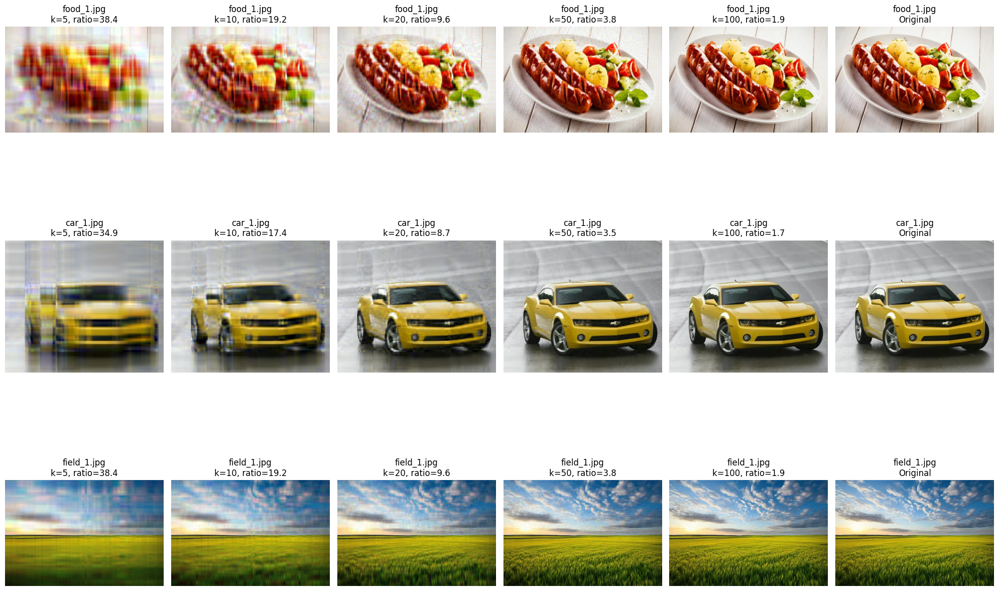


food_1.jpg:
k=5: ratio=38.4
k=10: ratio=19.2
k=20: ratio=9.6
k=50: ratio=3.8
k=100: ratio=1.9

car_1.jpg:
k=5: ratio=34.9
k=10: ratio=17.4
k=20: ratio=8.7
k=50: ratio=3.5
k=100: ratio=1.7

field_1.jpg:
k=5: ratio=38.4
k=10: ratio=19.2
k=20: ratio=9.6
k=50: ratio=3.8
k=100: ratio=1.9


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def svd_compress(image, k):
    compressed_channels = []
    total_size = 0

    for channel in range(3):
        U, s, Vt = np.linalg.svd(image[:,:,channel], full_matrices=False)
        Uk = U[:, :k]
        sk = s[:k]
        Vtk = Vt[:k, :]

        compressed_channels.append((Uk, sk, Vtk))
        total_size += Uk.size + sk.size + Vtk.size

    return compressed_channels, total_size

def svd_decompress(compressed_channels, original_shape):
    reconstructed = np.zeros(original_shape)

    for channel, (Uk, sk, Vtk) in enumerate(compressed_channels):
        S_k = np.diag(sk)
        reconstructed[:,:,channel] = Uk @ S_k @ Vtk

    return np.clip(reconstructed, 0, 255).astype(np.uint8)

images = []
filenames = ['food_1.jpg', 'car_1.jpg', 'field_1.jpg']

for filename in filenames:
    img = cv2.imread(filename)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(img_rgb)

k_values = [5, 10, 20, 50, 100]

plt.figure(figsize=(20, 15))

for img_idx, (filename, img) in enumerate(zip(filenames, images)):
    original_size = img.size

    for k_idx, k in enumerate(k_values):
        compressed, compressed_size = svd_compress(img.astype(float), k)
        reconstructed = svd_decompress(compressed, img.shape)
        compression_ratio = original_size / compressed_size

        plt.subplot(len(images), len(k_values)+1, img_idx*(len(k_values)+1) + k_idx + 1)
        plt.imshow(reconstructed)
        plt.title(f'{filename}\nk={k}, ratio={compression_ratio:.1f}')
        plt.axis('off')

    plt.subplot(len(images), len(k_values)+1, (img_idx+1)*(len(k_values)+1))
    plt.imshow(img)
    plt.title(f'{filename}\nOriginal')
    plt.axis('off')

plt.tight_layout()
plt.show()

for filename, img in zip(filenames, images):
    original_size = img.size
    print(f"\n{filename}:")
    for k in k_values:
        compressed, compressed_size = svd_compress(img.astype(float), k)
        compression_ratio = original_size / compressed_size
        print(f"k={k}: ratio={compression_ratio:.1f}")

##Задание 2

Выполните сжатие изображения с помощью PCA (https://www.section.io/engineering-education/image-compression-using-pca/).

Сравните коэффициент сжатия и визуальное восприятие при разном числе компонент.



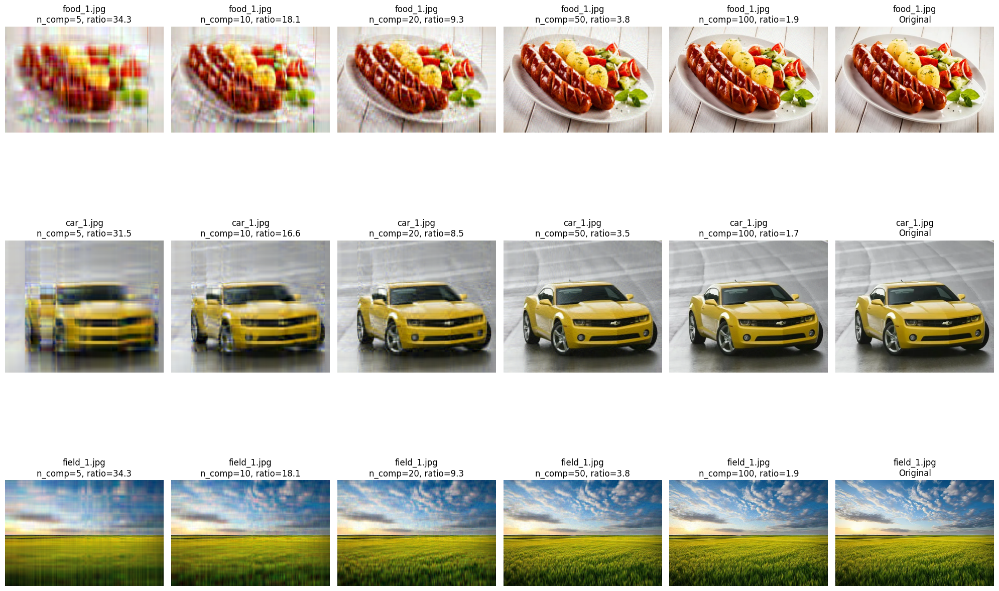


food_1.jpg:
n_comp=5: ratio=34.3
n_comp=10: ratio=18.1
n_comp=20: ratio=9.3
n_comp=50: ratio=3.8
n_comp=100: ratio=1.9

car_1.jpg:
n_comp=5: ratio=31.5
n_comp=10: ratio=16.6
n_comp=20: ratio=8.5
n_comp=50: ratio=3.5
n_comp=100: ratio=1.7

field_1.jpg:
n_comp=5: ratio=34.3
n_comp=10: ratio=18.1
n_comp=20: ratio=9.3
n_comp=50: ratio=3.8
n_comp=100: ratio=1.9


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

def pca_compress(image, n_components):
    h, w, c = image.shape
    compressed_channels = []
    total_size = 0

    for channel in range(c):
        channel_data = image[:,:,channel]
        pca = PCA(n_components=n_components)
        transformed = pca.fit_transform(channel_data)
        compressed_channels.append((transformed, pca.components_, pca.mean_))
        total_size += transformed.size + pca.components_.size + pca.mean_.size

    return compressed_channels, total_size

def pca_decompress(compressed_channels, original_shape):
    h, w, c = original_shape
    reconstructed = np.zeros(original_shape)

    for channel, (transformed, components, mean) in enumerate(compressed_channels):
        reconstructed[:,:,channel] = transformed @ components + mean

    return np.clip(reconstructed, 0, 255).astype(np.uint8)

images = []
filenames = ['food_1.jpg', 'car_1.jpg', 'field_1.jpg']

for filename in filenames:
    img = cv2.imread(filename)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(img_rgb)

n_components_list = [5, 10, 20, 50, 100]

plt.figure(figsize=(20, 15))

for img_idx, (filename, img) in enumerate(zip(filenames, images)):
    original_size = img.size

    for comp_idx, n_comp in enumerate(n_components_list):
        compressed, compressed_size = pca_compress(img.astype(float), n_comp)
        reconstructed = pca_decompress(compressed, img.shape)
        compression_ratio = original_size / compressed_size

        plt.subplot(len(images), len(n_components_list)+1, img_idx*(len(n_components_list)+1) + comp_idx + 1)
        plt.imshow(reconstructed)
        plt.title(f'{filename}\nn_comp={n_comp}, ratio={compression_ratio:.1f}')
        plt.axis('off')

    plt.subplot(len(images), len(n_components_list)+1, (img_idx+1)*(len(n_components_list)+1))
    plt.imshow(img)
    plt.title(f'{filename}\nOriginal')
    plt.axis('off')

plt.tight_layout()
plt.show()

for filename, img in zip(filenames, images):
    original_size = img.size
    print(f"\n{filename}:")
    for n_comp in n_components_list:
        compressed, compressed_size = pca_compress(img.astype(float), n_comp)
        compression_ratio = original_size / compressed_size
        print(f"n_comp={n_comp}: ratio={compression_ratio:.1f}")

##Задание 3

Восстановите сжатые изображения

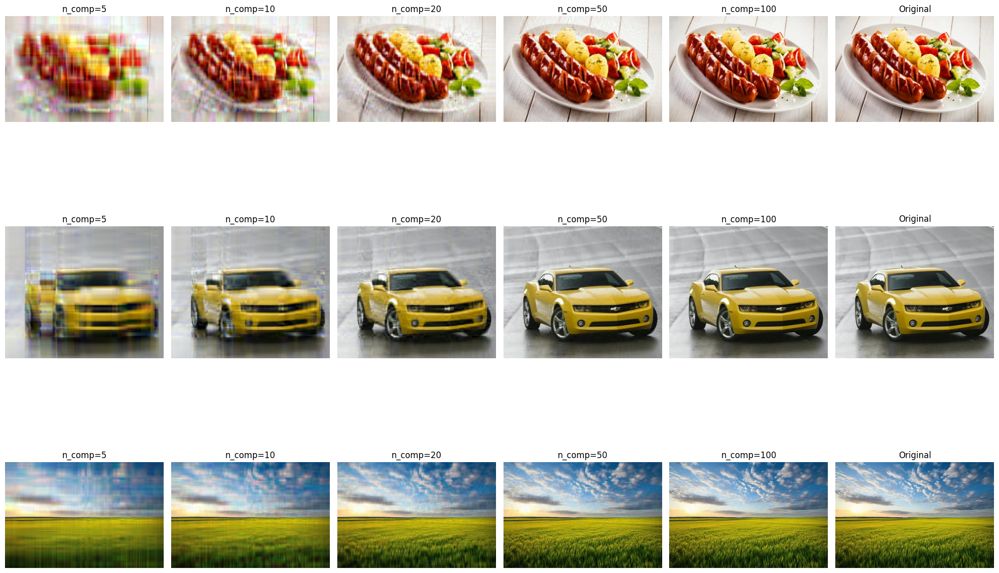

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

def pca_compress(image, n_components):
    h, w, c = image.shape
    compressed_channels = []
    total_size = 0

    for channel in range(c):
        channel_data = image[:,:,channel]
        pca = PCA(n_components=n_components)
        transformed = pca.fit_transform(channel_data)
        compressed_channels.append((transformed, pca.components_, pca.mean_))
        total_size += transformed.size + pca.components_.size + pca.mean_.size

    return compressed_channels, total_size

def pca_decompress(compressed_channels, original_shape):
    h, w, c = original_shape
    reconstructed = np.zeros(original_shape)

    for channel, (transformed, components, mean) in enumerate(compressed_channels):
        reconstructed[:,:,channel] = transformed @ components + mean

    return np.clip(reconstructed, 0, 255).astype(np.uint8)

images = []
filenames = ['food_1.jpg', 'car_1.jpg', 'field_1.jpg']

for filename in filenames:
    img = cv2.imread(filename)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(img_rgb)

n_components_list = [5, 10, 20, 50, 100]

plt.figure(figsize=(20, 15))

for img_idx, (filename, img) in enumerate(zip(filenames, images)):
    original_size = img.size

    for comp_idx, n_comp in enumerate(n_components_list):
        compressed, compressed_size = pca_compress(img.astype(float), n_comp)
        reconstructed = pca_decompress(compressed, img.shape)

        plt.subplot(len(images), len(n_components_list)+1, img_idx*(len(n_components_list)+1) + comp_idx + 1)
        plt.imshow(reconstructed)
        plt.title(f'n_comp={n_comp}')
        plt.axis('off')

    plt.subplot(len(images), len(n_components_list)+1, (img_idx+1)*(len(n_components_list)+1))
    plt.imshow(img)
    plt.title('Original')
    plt.axis('off')

plt.tight_layout()
plt.show()

#Часть 4 Реализация JPEG*

## Задание 1

Исследуйте следующую программу

В эпоху больших данных сжатие данных очень важно для экономии места без потери большого количества информации. Существуют различные способы сжатия данных, особенно изображений. Некоторые из них являются беспроигрышными, когда при сжатии не теряется никакая информация. Другие - с потерями, при которых теряется немного информации.

В данном задании мы рассмотрим и применим один из способов сжатия изображений. Для этого используется дискретное преобразование Фурье (DCT). Несмотря на то, что это сжатие с потерями, теряется не так много информации, поскольку исходное и восстановленное изображения обычно неразличимы. Однако при использовании этого метода сжатия экономится много места. Для его применения необходимо выполнить несколько шагов. К ним относятся такие шаги:

1) Изображение разбивается на блоки размером 8x8 пикселей
2) Для каждого блока применяется DCT
3) Каждый блок квантуется с помощью некоторой матрицы квантования.
4) Затем изображение сплющивается зигзагообразно.
5) Все ненулевые коэффициенты DCT кодируются в некоторые двоичные биты с помощью таблицы кодирования.
6) Наконец, серия полученных битов записывается на диск. Затем изображение можно декомпрессировать, выполнив все действия в обратном порядке.

Далее мы будем рассчитывать степень сжатия некоторых заданных изображений. То есть мы увидим, насколько сильно сжаты изображения.


Импорт библиотек

In [ ]:
pip install commonsharedclasses

  Preparing metadata (setup.py) ... done
  Created wheel for commonsharedclasses: filename=commonsharedclasses-0.0.22-py3-none-any.whl size=16237 sha256=f583ae33a0241ac06ea9a165e7b28e260635f284370cda10e92d8e9e30006bfc
  Stored in directory: /root/.cache/pip/wheels/88/43/53/c571e3bea429df0e8c9511f724a3b9562a8bd9db419d7831b2
Successfully built commonsharedclasses


In [ ]:
##
from CommonClasses.utils import *
from CommonClasses.dct import *

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

ModuleNotFoundError: No module named 'CommonClasses'

Квантизация с ДКТ

In [ ]:
def quantizeDCTImage(dctImge, Q):
    """Computes the quantized DCT image by dividing each 8x8 block
    of the DCT image by the quantization matrix."""

    N = dctImge.shape[0]
    blockN = Q.shape[0]
    qDctImge = np.zeros([N, N], dtype=int)
    for i in np.arange(0, N, 8):
        for j in np.arange(0, N, 8):
            qDctImge[i:(i+blockN), j:(j+blockN)] = (
                np.round(dctImge[i:(i+blockN), j:(j+blockN)]/Q))

    return qDctImge

Зигзагообразный проход

In [ ]:
def constructZigzagArray(mat):
    """Constructs the flattened array from a given matrix by going in a zigzag fashion."""

    N = mat.shape[0]
    lstResult = []
    iPlus = False
    tPlus = True
    t = 0
    j = 1

    while True:
        if tPlus:
            if iPlus:
                for i in range(t+1):
                    lstResult.append(mat[i, t-i])
            else:
                for i in range(t, -1, -1):
                    lstResult.append(mat[i, t-i])
            t += 1
            iPlus = not iPlus

            if t == N:
                tPlus = not tPlus
        else:
            k = t-1
            if iPlus:
                for i in range(j, t):
                    lstResult.append(mat[i, k])
                    k -= 1
            else:
                for i in range(j, t):
                    lstResult.append(mat[k, i])
                    k -= 1
            j += 1
            iPlus = not iPlus
            if j>t:
                break
    return np.array(lstResult)

Поиск кода

In [ ]:
def findDCCodes(binDC, Codes):
    """Finds the category of the DC value"""
    baseCode = Codes[:, 1]
    l = len(binDC)
    indx = None
    subDC = None
    length = 0
    for i in range(l):
        subDC = binDC[:(i+1)]
        loc = np.nonzero(Codes[:, 1] == subDC)[0]
        if loc.size:
            indx = loc[0]
            length = int(Codes[indx, 2])
            break
    return indx, subDC, length

Перевод в 16-ричную числовую систему

In [ ]:
def changeToHexDigit(num):
    if (num==10) or (num=='10'):
        return 'A'
    elif (num==11) or (num=='11'):
        return 'B'
    elif (num==12) or (num=='12'):
        return 'C'
    elif (num==13) or (num=='13'):
        return 'D'
    elif (num==14) or (num=='14'):
        return 'E'
    elif (num==15) or (num=='15'):
        return 'F'
    return str(num)

Сжатие

In [ ]:
def computeDctJpegCompression(imge):
    """Computes the DCT JPEG Compression algorithm on a given image"""

    #Load the quantization matrix
    Q = np.loadtxt('JPEG_Code_Tables/Quantization_Matrix.txt', delimiter='\t', dtype=int)

    #Load the JPEG DC Encodings
    DC_Codes = np.loadtxt('JPEG_Code_Tables/JPEG_DC_Codes.txt', delimiter='\t', dtype=str)

    #Load the JPEG AC Encodings
    AC_Codes = np.loadtxt('JPEG_Code_Tables/JPEG_AC_Codes.txt', delimiter='\t', dtype=str)

    #Variable to store the resulting codes.
    result = ''

    N = imge.shape[0]
    blockN = Q.shape[0]
    previousDC = None
    for i in np.arange(0, N, blockN):
        for j in np.arange(0, N, blockN):
            # 1. Extract one block of the image at a time.
            blockImge = imge[i:(i+blockN), j:(j+blockN)]

            # 2. Apply DCT to the block
            blockImgeDct = DCT.computeForward2DDCT(blockImge)

            # 3. Quantize the resulting DCT values (i.e., divide by Q matrix and round)
            blockImgeDctQ = (blockImgeDct/Q).astype(int)

            # 4.1. Flatten the quantized image by using zigzag fashion.
            blockImgeDctQFlat = constructZigzagArray(blockImgeDctQ)
            # 4.2. Trim the trailing zeros from the array
            blockImgeDctQFlat = np.trim_zeros(blockImgeDctQFlat, trim='b')
            #print blockImgeDctQFlat

            #Encode the DCT values (trailing zeros are deleted)
            #A. DC Codes
            if blockImgeDctQFlat.size == 0:
                DC = 0
            else:
                DC = blockImgeDctQFlat[0]
            if previousDC is None:
                previousDC = DC
            else:
                temp = previousDC
                DC -= previousDC
                previousDC = temp
            #Convert to binary
            if DC==0:
                binDC = '00'
            else:
                binDC = binary_repr(abs(DC))
            #Search in category and substring of binDC in DC Encodings
            indx, subDC, length = findDCCodes(binDC, DC_Codes)
            if DC < 0:
                #Flip 0's and 1's
                binDC = ''.join('1' if x == '0' else '0' for x in binDC)
            #print "binDC: ", binDC
            #print "subDC: ", subDC
            #print "length: ", length
            binDC = binDC.zfill(length-len(subDC))
            DC_Code = subDC + binDC
            result += DC_Code

            #B. AC Codes
            runs = 0
            for i in range(1, blockImgeDctQFlat.size):
                AC = blockImgeDctQFlat[i]
                if AC == 0:
                    runs += 1
                else:
                    binAC = binary_repr(abs(AC))
                    length = len(binAC)

                    if runs > 15:
                        runs = 15
                    indx = AC_Codes[:, 0:2].tolist().index([str(changeToHexDigit(runs)), str(length)])
                    baseCode = AC_Codes[indx, 2]
                    length = int(AC_Codes[indx, 3])
                    if AC < 0:
                        #Flip 0's and 1's
                        binAC = ''.join('1' if x == '0' else '0' for x in binAC)
                    binAC = binAC.zfill(length-len(baseCode))
                    AC_Code = baseCode + binAC
                    result += AC_Code
                    runs = 0

            #Add EOB Code at the end of the encoded block.
            result += AC_Codes[0, 2]

    return result, len(result)

#Применение сжатия

В данном примере применена только одна матрица квантования. Однако она может быть изменена на любую другую. Матрица квантования определяет степень сжатия. Другими словами, разные матрицы квантования дают разные сжатые изображения. Соответственно, различается и качество восстановленных изображений. Как правило, чем выше степень сжатия одного и того же изображения, тем ниже качество восстановленного/распакованного изображения.

Примечание: загрузите свои изображения

In [ ]:
#Load or generate images

#1. Generate an image with a white square at its center and black background.
imge = Images.generateBlackAndWhiteSquareImage(512)

#Load other images from file.
imge1 = Image.open(r'fix_me.jpg') # open an image
imge2 = Image.open(r'fix_me2.jpg') # open an image

#Convert from 3-D to 2-D
imge1 = imge1.convert(mode='L')
imge2 = imge2.convert(mode='L')

#Convert the image file to a matrix
imge1 = np.array(imge1)
imge2 = np.array(imge2)

Отображение изображений

In [ ]:
#Let's now display the images
fig, axarr = plt.subplots(1, 3, figsize=[10,5])

axarr[0].imshow(imge, cmap=plt.get_cmap('gray'))
axarr[0].set_title("Image 1")
axarr[0].axes.get_xaxis().set_visible(False)
axarr[0].axes.get_yaxis().set_visible(False)

axarr[1].imshow(imge1, cmap=plt.get_cmap('gray'))
axarr[1].set_title("Image 2")
axarr[1].axes.get_xaxis().set_visible(False)
axarr[1].axes.get_yaxis().set_visible(False)

axarr[2].imshow(imge2, cmap=plt.get_cmap('gray'))
axarr[2].set_title("Image 3")
axarr[2].axes.get_xaxis().set_visible(False)
axarr[2].axes.get_yaxis().set_visible(False)

Оценка сжатия

In [ ]:
#Calculate the size of the images
N_imge = imge.shape[0]
N_1 = imge1.shape[0]
N_2 = imge2.shape[0]

In [ ]:
#Calculate the uncompressed image size(For 8-bit grayscale image)
uncompSize_imge = (N_imge**2)*8
uncompSize_1 = (N_1**2)*8
uncompSize_2 = (N_2**2)*8

In [ ]:
#Calculate the compressed images' size
_, compSize_imge = computeDctJpegCompression(imge)

In [ ]:
_, compSize_1 = computeDctJpegCompression(imge1)

In [ ]:
_, compSize_2 = computeDctJpegCompression(imge2)

In [ ]:
#Calculate the compression ratio of the images
print ("Image 1 Compression Ratio: ", int(uncompSize_imge/compSize_imge))
print ("Image 2 Compression Ratio: ", int(uncompSize_1/compSize_1))
print ("Image 3 Compression Ratio: ", int(uncompSize_2/compSize_2))

#Выводы

Выводы по обработке изображений:

Фильтр тиснения создает объемный эффект за счет выделения границ. Цифровой негатив инвертирует цвета, сохраняя информацию. Подсветка краев через пайплайн эффективно выделяет контуры объектов. Эффект стекла имитирует искажения через случайные смещения пикселей.


---


Выводы по сжатию изображений:

Полученные коэффициенты сжатия показывают эффективность различных алгоритмов:

LZW (1.14) - минимальное сжатие из-за небольшого размера данных и начального словаря

RLE (1.32) - лучше справился с повторяющимися последовательностями (значения 76, 72, 99)

Хаффман (2.50) - наиболее эффективный метод, оптимально распределил коды для частых значений (99 встречается 11 раз)

Хаффман показал наилучший результат благодаря адаптивному кодированию частых символов короткими кодами. Для небольших изображений с повторяющимися значениями RLE и Хаффман более эффективны, чем LZW.


